In [2]:
!pip install jovian --upgrade --quiet

In [3]:
!ls

blank-starter.ipynb  owid-covid-data.csv  work


In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
pd.set_option('display.max_columns', None)
import warnings
warnings.simplefilter(action='ignore')

In [6]:
df=pd.read_csv('owid-covid-data.csv',parse_dates=['date'])

In [7]:
df.shape

(57992, 52)

In [8]:
df.isna().sum().sort_values(ascending=False)

total_vaccinations                    57832
total_vaccinations_per_hundred        57832
weekly_icu_admissions                 57449
weekly_icu_admissions_per_million     57449
weekly_hosp_admissions                57115
weekly_hosp_admissions_per_million    57115
icu_patients                          51920
icu_patients_per_million              51920
hosp_patients                         51161
hosp_patients_per_million             51161
total_tests                           31336
total_tests_per_thousand              31336
new_tests                             31270
new_tests_per_thousand                31270
tests_per_case                        30513
handwashing_facilities                30101
positive_rate                         30047
new_tests_smoothed                    28061
new_tests_smoothed_per_thousand       28061
tests_units                           26951
extreme_poverty                       20215
reproduction_rate                     15489
male_smokers                    

### One thing very obvious in the dataset is the missing hospital admission data. we will attempt to build a model to predict the hospital admissions that would be needed and whether enough beds were available

In [9]:
hospital_cases=df[df['hosp_patients'].notna()]

In [10]:
non_hospital_cases=df[df['hosp_patients'].isna()]

In [11]:
hospital_cases.shape,non_hospital_cases.shape

((6831, 52), (51161, 52))

In [12]:
hosp_cases_concise=hospital_cases.loc[:,['total_cases_per_million','location','date','iso_code','human_development_index','gdp_per_capita','cardiovasc_death_rate','median_age','total_deaths_per_million','life_expectancy','diabetes_prevalence']]

In [13]:
nonhosp_cases_concise=non_hospital_cases.loc[:,['total_cases_per_million','location','date','iso_code','human_development_index','gdp_per_capita','cardiovasc_death_rate','median_age','total_deaths_per_million','life_expectancy','diabetes_prevalence']]

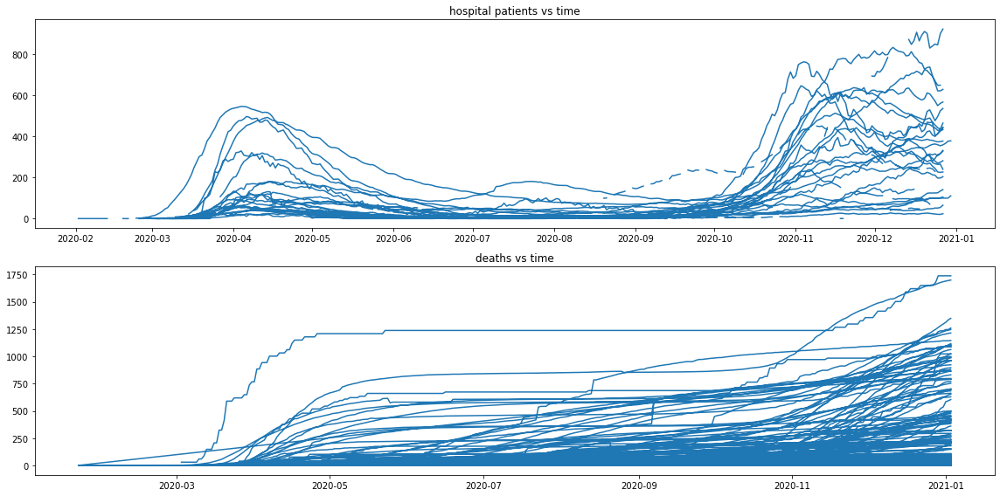

In [14]:
fig,axes=plt.subplots(figsize=(16,8),nrows=2,ncols=1)
axes[0].plot(df['date'],df['hosp_patients_per_million'])
axes[0].set_title('hospital patients vs time')
axes[1].plot(df['date'],df['total_deaths_per_million'])
axes[1].set_title('deaths vs time')
plt.tight_layout()
plt.show()

#### data is indexed date wise. the temporal sequence of events is interesting as it shows 2 waves of deaths. Hospital admissions increased after the second wave of deaths around nov 2020

In [15]:
hcc=pd.DataFrame(hosp_cases_concise.isna().sum().sort_values(ascending=False))
nonhcc=pd.DataFrame(nonhosp_cases_concise.isna().sum().sort_values(ascending=False))

In [16]:
hcc[0]=(hcc[0]/6831)*100

In [17]:
nonhcc[0]=(nonhcc[0]/51161)*100

In [18]:
covid_df_na=pd.merge(hcc,nonhcc,left_index=True,right_index=True)
covid_df_na.columns=['hospital','non_hospital']
covid_df=covid_df_na.reset_index()

In [19]:
covid_df=covid_df.melt(id_vars=['index'],value_vars=['hospital','non_hospital'])
covid_df.head()

,index,variable,value
0,total_deaths_per_million,hospital,2.547211
1,total_cases_per_million,hospital,0.058557
2,diabetes_prevalence,hospital,0.000000
3,life_expectancy,hospital,0.000000
4,median_age,hospital,0.000000


<Figure size 720x720 with 0 Axes>

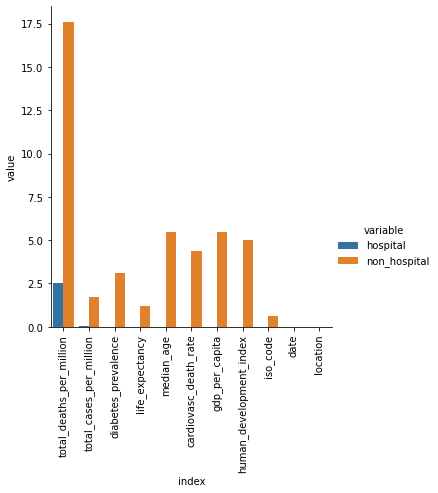

In [20]:
fig=plt.figure(figsize=(10,10))
fig=sns.catplot(data=covid_df,x='index',y='value',kind='bar',hue='variable')
fig.set_xticklabels(rotation=90)
plt.show()

#### absence of data is common in the set of entries where hospitalization data is missing. 17 % of records of death are missing

In [21]:
!pip install plotly==4.14.2

     |████████████████████████████████| 13.2 MB 4.0 MB/s eta 0:00:01
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11429 sha256=4b4abb621c30fbc319e7c33f306161ed6e2773119851a843b6a11dcfc3f9f256
  Stored in directory: /home/jovyan/.cache/pip/wheels/c4/a7/48/0a434133f6d56e878ca511c0e6c38326907c0792f67b476e56
Successfully built retrying


In [22]:
import plotly.express as px
fig=px.line(hosp_cases_concise,x='date',y='total_cases_per_million',title='hospital data present',color='location')
fig.show()

In [23]:
fig=px.line(nonhosp_cases_concise,x='date',y='total_cases_per_million',title='hospital data absent',color='location')
fig.show()

In [24]:
hosp_cases_location=hosp_cases_concise.groupby('location').aggregate(lambda x:x.sum()/x.count())
hosp_cases_location.head()

,total_cases_per_million,human_development_index,gdp_per_capita,cardiovasc_death_rate,median_age,total_deaths_per_million,life_expectancy,diabetes_prevalence
location,,,,,,,,
Austria,8454.848668,0.908,45436.686,145.183,44.4,135.802587,81.54,6.35
Belgium,15356.529278,0.916,42658.576,114.898,41.8,854.939451,81.63,4.29
Canada,4254.222539,0.926,44017.591,105.599,41.4,209.099737,82.43,7.37
Croatia,8431.334250,0.831,22669.797,253.782,44.0,130.950270,78.49,5.59
Cyprus,2903.968424,0.869,32415.132,141.171,37.3,26.495530,80.98,9.24


In [25]:
nonhosp_cases_location=nonhosp_cases_concise.groupby('location').aggregate(lambda x:x.sum()/x.count())
nonhosp_cases_location.head()

,total_cases_per_million,human_development_index,gdp_per_capita,cardiovasc_death_rate,median_age,total_deaths_per_million,life_expectancy,diabetes_prevalence
location,,,,,,,,
Afghanistan,704.601130,0.498,1803.987,597.029,18.6,27.106104,64.83,9.59
Albania,4507.283282,0.785,11803.431,304.195,38.0,106.848365,78.57,10.08
Algeria,790.446589,0.754,13913.839,278.364,29.1,29.547027,76.88,6.73
Andorra,29721.333425,0.858,NaN,109.135,NaN,707.521660,83.73,7.97
Angola,146.490007,0.581,5819.495,276.045,16.8,4.118758,61.15,3.94


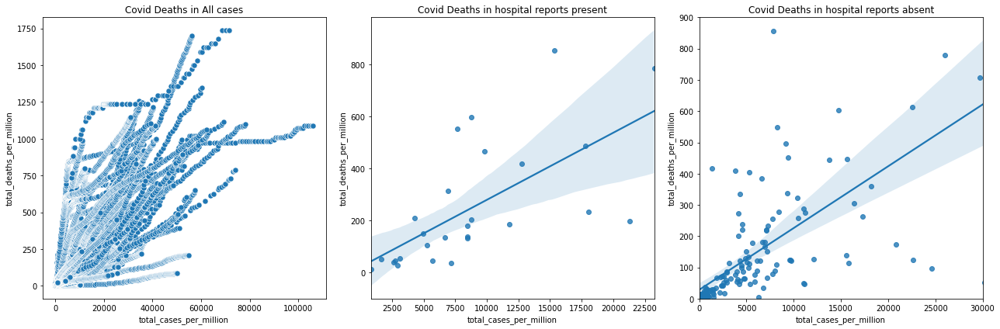

In [26]:
fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(18,6))
sns.scatterplot('total_cases_per_million','total_deaths_per_million',data=df,ax=axes[0],s=50)
axes[0].set_title('Covid Deaths in All cases')

sns.regplot('total_cases_per_million','total_deaths_per_million',data=hosp_cases_location,ax=axes[1])
axes[1].set_title('Covid Deaths in hospital reports present')
sns.regplot('total_cases_per_million','total_deaths_per_million',data=nonhosp_cases_location,ax=axes[2])
axes[2].set_title('Covid Deaths in hospital reports absent')
axes[2].set(xlim=(0,30000))
axes[2].set(ylim=(0,900))
plt.tight_layout()

In [27]:
hosp_label=['hospital data' for n in range(hosp_cases_location.shape[0])]
nonhosp_label=['no hospital data' for n in range(nonhosp_cases_location.shape[0])]
len(hosp_label),len(nonhosp_label)

(27, 192)

In [28]:
hosp_cases_location['label']=hosp_label
nonhosp_cases_location['label']=nonhosp_label

In [29]:
combine_df=pd.concat([hosp_cases_location,nonhosp_cases_location],axis=0,join='outer',ignore_index=True)
combine_df.reset_index()
combine_df.head()

,total_cases_per_million,human_development_index,gdp_per_capita,cardiovasc_death_rate,median_age,total_deaths_per_million,life_expectancy,diabetes_prevalence,label
0,8454.848668,0.908,45436.686,145.183,44.4,135.802587,81.54,6.35,hospital data
1,15356.529278,0.916,42658.576,114.898,41.8,854.939451,81.63,4.29,hospital data
2,4254.222539,0.926,44017.591,105.599,41.4,209.099737,82.43,7.37,hospital data
3,8431.334250,0.831,22669.797,253.782,44.0,130.950270,78.49,5.59,hospital data
4,2903.968424,0.869,32415.132,141.171,37.3,26.495530,80.98,9.24,hospital data


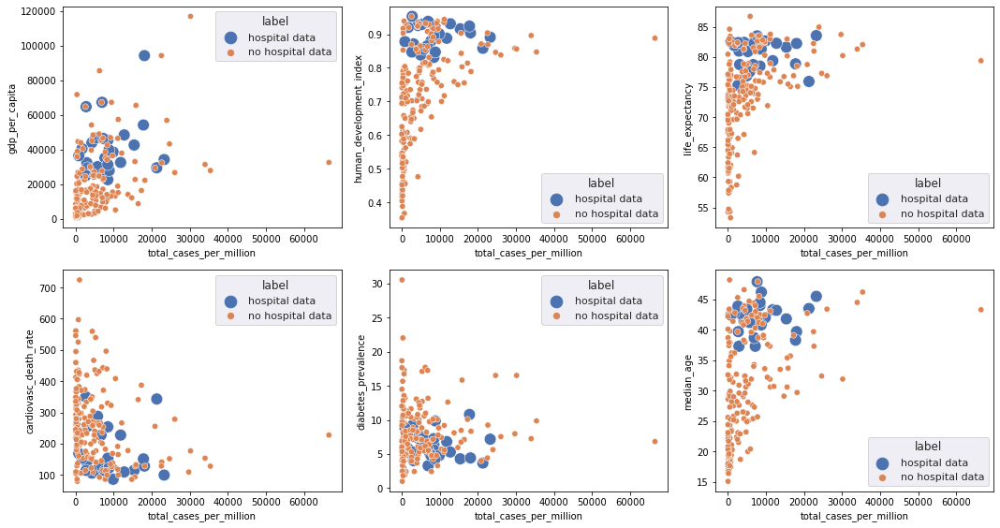

In [30]:
fig,axs=plt.subplots(nrows=2,ncols=3,figsize=(15,8))
sns.set(font_scale=1)
axs[0,0]=sns.scatterplot('total_cases_per_million','gdp_per_capita',data=combine_df,hue='label',ax=axs[0,0],size='label',sizes=(40,160))
axs[0,1]=sns.scatterplot('total_cases_per_million','human_development_index',data=combine_df,hue='label',ax=axs[0,1],size='label',sizes=(40,160))
axs[0,2]=sns.scatterplot('total_cases_per_million','life_expectancy',data=combine_df,hue='label',ax=axs[0,2],size='label',sizes=(40,160))
axs[1,0]=sns.scatterplot('total_cases_per_million','cardiovasc_death_rate',data=combine_df,hue='label',ax=axs[1,0],size='label',sizes=(40,160))
axs[1,1]=sns.scatterplot('total_cases_per_million','diabetes_prevalence',data=combine_df,hue='label',ax=axs[1,1],size='label',sizes=(40,160))
axs[1,2]=sns.scatterplot('total_cases_per_million','median_age',data=combine_df,hue='label',ax=axs[1,2],size='label',sizes=(40,160))
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

### Countrywise presence or absence of hospital data distinctly classifies the covid dataset. People in countries not recording hospialization data are poorer, have poor health and lower life expectancy. Significantly, younger people are infected in these countries  

In [31]:
hosp_cases_fraction=hospital_cases.loc[:,['total_cases_per_million','hosp_patients_per_million','location','date','iso_code','human_development_index','gdp_per_capita','cardiovasc_death_rate','median_age','total_deaths_per_million','life_expectancy','diabetes_prevalence']]

In [32]:
hosp_cases_frcn_loc=hosp_cases_fraction.groupby('location').aggregate(lambda x:x.sum()/x.count())

In [33]:
hosp_cases_frcn_loc['hosp_frac']=hosp_cases_frcn_loc['hosp_patients_per_million']/hosp_cases_frcn_loc['total_cases_per_million']

In [34]:
hosp_cases_frcn_loc.head()

,total_cases_per_million,hosp_patients_per_million,human_development_index,gdp_per_capita,cardiovasc_death_rate,median_age,total_deaths_per_million,life_expectancy,diabetes_prevalence,hosp_frac
location,,,,,,,,,,
Austria,8454.848668,96.923295,0.908,45436.686,145.183,44.4,135.802587,81.54,6.35,0.011464
Belgium,15356.529278,188.084431,0.916,42658.576,114.898,41.8,854.939451,81.63,4.29,0.012248
Canada,4254.222539,36.218168,0.926,44017.591,105.599,41.4,209.099737,82.43,7.37,0.008513
Croatia,8431.334250,159.278977,0.831,22669.797,253.782,44.0,130.950270,78.49,5.59,0.018891
Cyprus,2903.968424,29.215809,0.869,32415.132,141.171,37.3,26.495530,80.98,9.24,0.010061


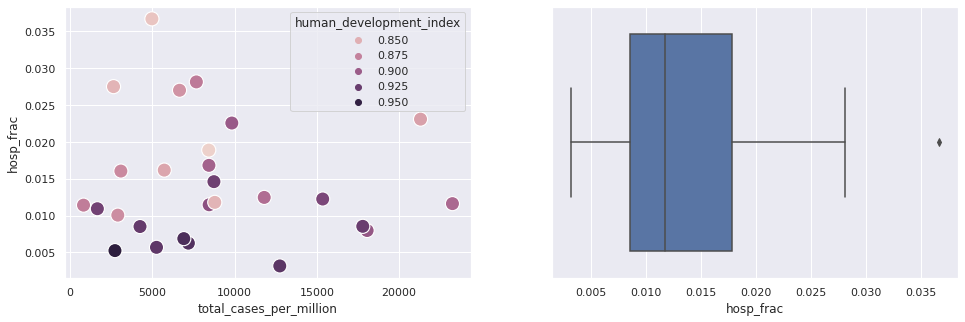

In [35]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(16,5))
axs[0]=sns.scatterplot('total_cases_per_million','hosp_frac',data=hosp_cases_frcn_loc,s=200,hue='human_development_index',ax=axs[0])
axs[1]=sns.boxplot(x='hosp_frac',data=hosp_cases_frcn_loc,hue='human_development_index',ax=axs[1])
plt.show()

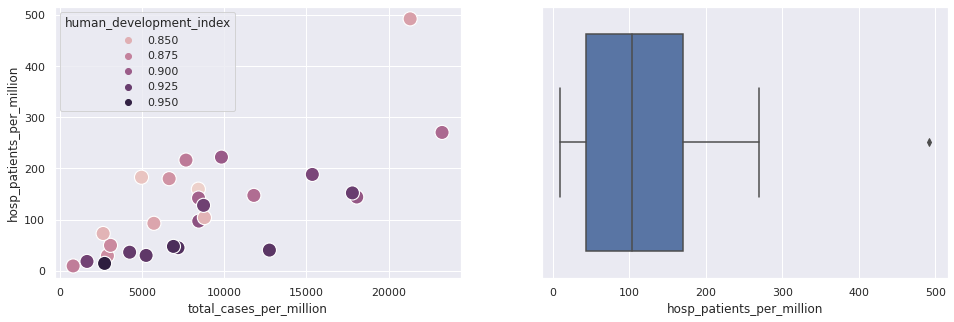

In [36]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(16,5))
axs[0]=sns.scatterplot('total_cases_per_million','hosp_patients_per_million',data=hosp_cases_frcn_loc,s=200,hue='human_development_index',ax=axs[0])
axs[1]=sns.boxplot(x='hosp_patients_per_million',data=hosp_cases_frcn_loc,hue='human_development_index',ax=axs[1])
plt.show()

### In the population where hospitalization data is available, we see that hospitalization increased as cases increased. But as the plot for fraction hospitalized shows, beyond 10K cases per million, the fraction hospitalized decreased, possibly as the medical facility could not cope with the influx

### just running my first regressor. a tentative run as data has not been cleaned yet. we will predict hospitalization data. As the data is organized by date and location, there is an oversampling for numerical data columns, but since it is across all the columns, it should not affect the analysis

In [37]:
y=hosp_cases_fraction['hosp_patients_per_million']

In [38]:
hosp_cases_fraction.columns

Index(['total_cases_per_million', 'hosp_patients_per_million', 'location',
       'date', 'iso_code', 'human_development_index', 'gdp_per_capita',
       'cardiovasc_death_rate', 'median_age', 'total_deaths_per_million',
       'life_expectancy', 'diabetes_prevalence'],
      dtype='object')

In [39]:
X=hosp_cases_fraction.drop(['iso_code','hosp_patients_per_million','location','date'],axis=1)
X.columns

Index(['total_cases_per_million', 'human_development_index', 'gdp_per_capita',
       'cardiovasc_death_rate', 'median_age', 'total_deaths_per_million',
       'life_expectancy', 'diabetes_prevalence'],
      dtype='object')

In [40]:
X.isna().sum()

total_cases_per_million       4
human_development_index       0
gdp_per_capita                0
cardiovasc_death_rate         0
median_age                    0
total_deaths_per_million    174
life_expectancy               0
diabetes_prevalence           0
dtype: int64

In [41]:
X.fillna(X.mean(),inplace=True)
X.isna().sum()

total_cases_per_million     0
human_development_index     0
gdp_per_capita              0
cardiovasc_death_rate       0
median_age                  0
total_deaths_per_million    0
life_expectancy             0
diabetes_prevalence         0
dtype: int64

In [42]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [43]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

### loading the model libraries

In [44]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error,r2_score

### fitting Multiple Linear Regression to dataset

In [45]:
cv = KFold(n_splits=10, random_state=1, shuffle=True)

In [46]:
lin_reg = LinearRegression(fit_intercept=True)

In [47]:
scores = cross_val_score(lin_reg, X_train, y_train, cv=cv, n_jobs=-1,verbose=1)
# report performance
print(f'R2 value is {scores}')

R2 value is [0.55279861 0.54702937 0.57259418 0.50910775 0.60564128 0.54515936
 0.53825873 0.56688205 0.5091864  0.55525391]


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


### The linear regression model fits poorly 

### Fitting Polynomial Regression to the dataset

In [48]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree = 4) # create polynomial model
X_poly_train = poly_reg.fit_transform(X_train) # fit and transform train data with polynomial features
X_poly_test = poly_reg.fit_transform(X_test) # fit and transform test data with polynomial features

In [49]:
X_poly_train.shape,X_poly_test.shape

((5464, 495), (1367, 495))

In [50]:
lin_reg_poly = LinearRegression()

In [51]:
scores = cross_val_score(lin_reg_poly, X_poly_train, y_train, cv=cv, n_jobs=-1,verbose=1)
# report performance
print(f'R2 value is {scores}')

[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.


R2 value is [0.9321066  0.95978221 0.96634294 0.97600693 0.98262926 0.98261847
 0.94867818 0.97933896 0.97444106 0.94938624]


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   13.8s finished


In [52]:
lin_reg_poly.fit(X_poly_train, y_train) # fit linear regression model with polynomial fitted training data

LinearRegression()

In [53]:
y_pred_train=lin_reg_poly.predict(X_poly_train) # predict the target using training data

In [54]:
y_pred_test=lin_reg_poly.predict(X_poly_test)

In [55]:
r2_score(y_test,y_pred_test) #R2 on test data

0.9544416124837038

In [56]:
np.sqrt(mean_squared_error(y_test,y_pred_test)) # RMSE on test data

36.705995362168146

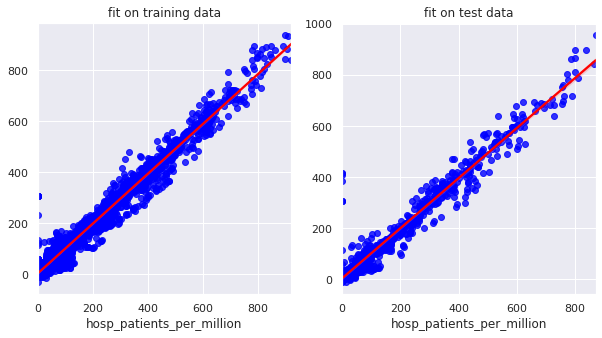

In [57]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(10,5))
axs[0]=sns.regplot(y_train,y_pred_train,scatter_kws={"color": "blue"}, line_kws={"color": "red"},ax=axs[0])
axs[0].set_title('fit on training data')
axs[1]=sns.regplot(y_test,y_pred_test,scatter_kws={"color": "blue"}, line_kws={"color": "red"},ax=axs[1])
axs[1].set_title('fit on test data')
plt.show()

### <font color='blue'> since the test and train R2 values are high, the model fits well hence we shall now try to predict the hospitalization where the data is missing </font>

In [58]:
X_non_hospital=non_hospital_cases.loc[:,('total_cases_per_million', 'human_development_index', 'gdp_per_capita',
       'cardiovasc_death_rate', 'median_age', 'total_deaths_per_million',
       'life_expectancy', 'diabetes_prevalence')]

In [59]:
X_non_hospital.isna().sum()

total_cases_per_million      885
human_development_index     2550
gdp_per_capita              2794
cardiovasc_death_rate       2230
median_age                  2809
total_deaths_per_million    9011
life_expectancy              628
diabetes_prevalence         1574
dtype: int64

In [60]:
X_non_hospital.mean()

total_cases_per_million      4204.540793
human_development_index         0.691004
gdp_per_capita              16134.247720
cardiovasc_death_rate         268.466126
median_age                     29.027058
total_deaths_per_million      101.689135
life_expectancy                72.131498
diabetes_prevalence             7.981744
dtype: float64

In [61]:
X_non_hospital.fillna(X_non_hospital.mean(),inplace=True)
X_non_hospital.isna().sum()

total_cases_per_million     0
human_development_index     0
gdp_per_capita              0
cardiovasc_death_rate       0
median_age                  0
total_deaths_per_million    0
life_expectancy             0
diabetes_prevalence         0
dtype: int64

In [62]:
# scaling the unknown sample data
X_non_hospital = sc_X.transform(X_non_hospital)

In [63]:
# fitting Polynomial Regression to dataset
X_poly_nonhosp = poly_reg.fit_transform(X_non_hospital) # fit and transform non hospital data with polynomial features

In [64]:
X_poly_train.shape,X_poly_nonhosp.shape

((5464, 495), (51161, 495))

In [65]:
y_pred_nonhosp=lin_reg_poly.predict(X_poly_nonhosp)

In [66]:
non_hospital_cases.loc[:,'hosp_patients_per_million_cal']=y_pred_nonhosp


In [67]:
non_hospital_cases.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,total_vaccinations_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,hosp_patients_per_million_cal
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,0.026,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,-2.577019e+16
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,-2.577019e+16
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,-2.577019e+16
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,-2.577019e+16
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,-2.577019e+16


### error in interpreting data

In [68]:
non_hospital_cases[(non_hospital_cases.hosp_patients_per_million_cal>=0) & (non_hospital_cases.hosp_patients_per_million_cal<=1000)].shape[0]

1299

In [69]:
a=[-1e18,-1000,0,10,1000,10000]
b=[-1000,0,10,1000,10000,100000]
for a,b in zip(a,b):
    nums=non_hospital_cases[(non_hospital_cases.hosp_patients_per_million_cal>=a) & (non_hospital_cases.hosp_patients_per_million_cal<=b)].shape[0]
    print(f'the cases between {a} and {b} is {nums}')

the cases between -1e+18 and -1000 is 33816
the cases between -1000 and 0 is 469
the cases between 0 and 10 is 161
the cases between 10 and 1000 is 1138
the cases between 1000 and 10000 is 51
the cases between 10000 and 100000 is 0


In [70]:
plausible_nonhosp_cases=non_hospital_cases[(non_hospital_cases.hosp_patients_per_million_cal>=0) & (non_hospital_cases.hosp_patients_per_million_cal<=1000)]

In [71]:
plausible_nonhosp_cases.groupby('location').aggregate(lambda x:x.sum()/x.count())

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,total_vaccinations_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,hosp_patients_per_million_cal
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Austria,9.645985e+04,881.851852,799.555630,1623.962963,21.148148,20.460333,10710.145185,97.913963,88.776222,180.312111,2.348111,2.271778,2.157500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17631.333333,3.794220e+06,421.280333,1.957667,21076.000000,2.340000,0.091000,11.133333,6.000000e+03,0.070000,74.119500,9006400.0,106.749,44.4,19.202,13.748,45436.686,0.7,145.183,6.35,28.4,30.9,NaN,7.370,81.54,0.908,159.376515
Belgium,9.621987e+04,251.553191,287.520429,12409.363636,45.909091,12.112262,8302.248383,21.705021,24.808429,1070.731364,3.961273,1.045095,2.480000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6791.823529,1.221114e+06,105.362765,0.586000,8875.600000,0.765800,0.075273,13.454545,NaN,NaN,13.448250,11589616.0,375.564,41.8,18.571,12.849,42658.576,0.2,114.898,4.29,25.1,31.4,NaN,5.640,81.63,0.916,354.221332
Canada,5.914550e+05,7202.500000,6695.892500,15715.750000,95.500000,122.821500,15670.938000,190.834250,177.411750,416.398000,2.530250,3.254000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.068150e+05,0.283333,NaN,37742157.0,4.037,41.4,16.984,10.797,44017.591,0.5,105.599,7.37,12.0,16.6,NaN,2.500,82.43,0.926,127.355835
Croatia,4.850914e+04,293.400000,326.742886,894.628571,14.000000,15.273429,11816.315714,71.469086,79.591057,217.922229,3.410286,3.720457,1.395769,NaN,NaN,NaN,NaN,NaN,NaN,1496.580000,364.551000,1762.785714,2.162427e+05,52.674345,0.429464,1476.090909,0.359576,0.126750,9.106250,7.864000e+03,0.190000,84.146875,4105268.0,73.726,44.0,19.724,13.053,22669.797,0.7,253.782,5.59,34.3,39.9,NaN,5.540,78.49,0.831,155.329286
Cyprus,1.932506e+04,414.250000,386.812500,105.000000,2.625000,2.446438,22063.117375,472.942688,441.617625,119.876812,2.996812,2.792875,NaN,NaN,NaN,NaN,NaN,8.500000,9.704500,77.000000,87.910000,10143.846154,9.473597e+05,1081.585538,11.581000,10334.461538,11.798692,0.036308,28.084615,NaN,NaN,69.440000,875899.0,127.657,37.3,13.416,8.563,32415.132,NaN,141.171,9.24,19.6,52.7,NaN,3.400,80.98,0.869,121.637817
Czechia,7.023694e+05,12284.600000,7922.114400,11434.800000,133.400000,111.485600,65586.943800,1147.130400,739.763600,1067.776600,12.456800,10.410600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31519.750000,3.765345e+06,351.606000,2.943250,20645.000000,1.927750,0.363500,2.775000,NaN,NaN,69.440000,10708982.0,137.176,43.3,19.027,11.580,32605.906,NaN,227.485,6.82,30.5,38.3,NaN,6.630,79.38,0.888,202.270068
Denmark,4.142483e+04,564.620690,743.660625,880.461538,15.615385,7.422625,7151.826069,97.479448,128.389917,152.008077,2.696000,1.281500,1.281111,NaN,NaN,NaN,NaN,NaN,NaN,43.894750,7.578250,6842.309524,5.902620e+05,101.906333,1.181286,4848.062500,0.836896,0.068842,115.931579,2.765486e+04,0.478571,14.186038,5792203.0,136.520,42.3,19.677,12.325,46682.515,0.2,114.767,6.41,19.3,18.8,NaN,2.500,80.90,0.929,45.979584
Estonia,2.766614e+04,534.142857,543.143000,229.714286,5.714286,4.959000,20855.883429,402.659143,409.443571,173.168143,4.307857,3.738714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5054.500000,6.296945e+05,474.689750,3.810000,418

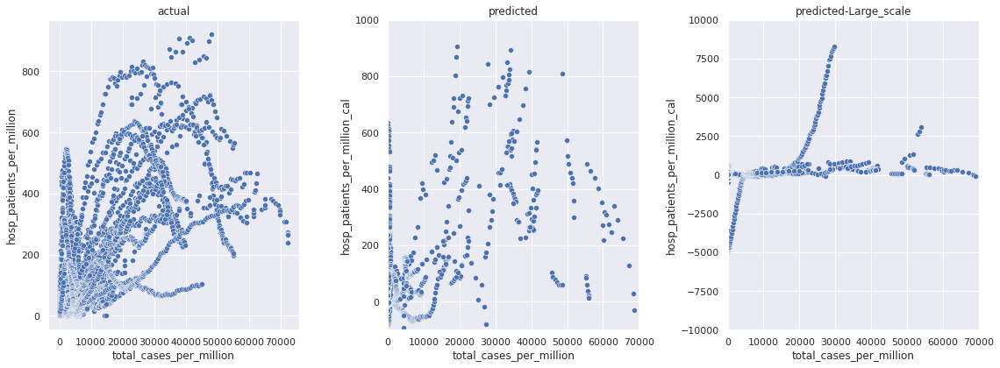

In [72]:
fig,axs=plt.subplots(nrows=1,ncols=3,figsize=(16,6))
axs[0]=sns.scatterplot(x='total_cases_per_million',y='hosp_patients_per_million',data=hosp_cases_fraction,ax=axs[0])
axs[0].set_title('actual')
axs[1]=sns.scatterplot(x='total_cases_per_million',y='hosp_patients_per_million_cal',data=non_hospital_cases,ax=axs[1])
axs[1].set_title('predicted')
axs[1].set_xlim(0,70000)
axs[1].set_ylim(-100,1000)
axs[2]=sns.scatterplot(x='total_cases_per_million',y='hosp_patients_per_million_cal',data=non_hospital_cases,ax=axs[2])
axs[2].set_title('predicted-Large_scale')
axs[2].set_xlim(0,70000)
axs[2].set_ylim(-10000,10000)
plt.tight_layout()
plt.show()

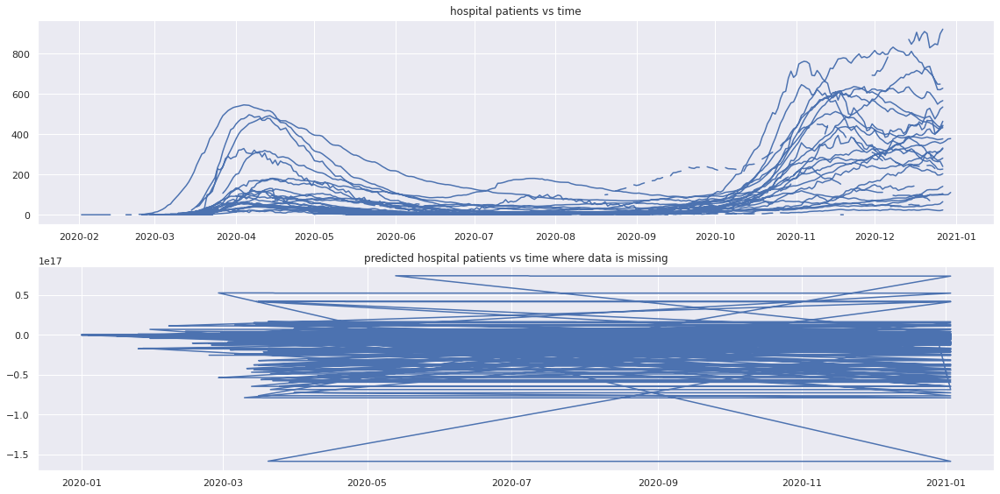

In [73]:
fig,axes=plt.subplots(figsize=(16,8),nrows=2,ncols=1)
axes[0].plot(df['date'],df['hosp_patients_per_million'])
axes[0].set_title('hospital patients vs time')
axes[1].plot(non_hospital_cases['date'],non_hospital_cases['hosp_patients_per_million_cal'])
axes[1].set_title('predicted hospital patients vs time where data is missing')
plt.tight_layout()
plt.show()

### <font color='blue'> the features we took for prediction actually classified the population between the 'haves', those who could afford hospitalization and the 'havenots', those who couldn't afford hospitalization. The non-uniformity of the dataset is reflected in the abnormal negative values returned by the model </font>

### Random Forest Regression model

In [74]:
params=[{'n_estimators':[10,50,100]},{'max_depth':[1,4,6]}]

In [81]:
random_forest_reg=RandomForestRegressor() # create the random forest model

In [82]:
rf_grid=GridSearchCV(estimator=random_forest_reg, param_grid=params,cv=cv,verbose=1)
rf_grid.fit(X_train, y_train)

Fitting 10 folds for each of 6 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:   31.3s finished


GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=RandomForestRegressor(),
             param_grid=[{'n_estimators': [10, 50, 100]},
                         {'max_depth': [1, 4, 6]}],
             verbose=1)

In [83]:
print(rf_grid.best_score_)
print(rf_grid.best_params_)

0.9944631991303648
{'n_estimators': 50}


In [84]:
y_pred_rf_train=rf_grid.predict(X_train)

In [85]:
y_pred_rf=rf_grid.predict(X_test)

In [86]:
r2_score(y_test,y_pred_rf) #R2 on test data

0.9884122466544566

In [87]:
np.sqrt(mean_squared_error(y_test,y_pred_rf)) # RMSE on test data

18.511962181804662

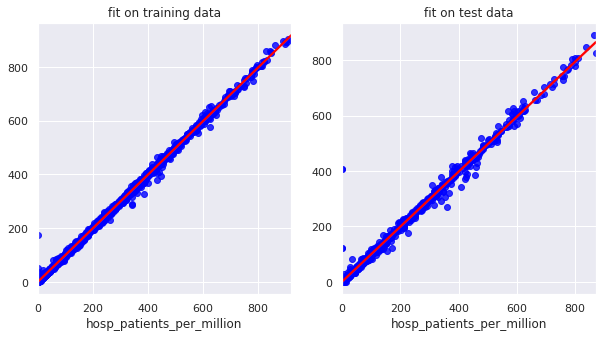

In [88]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(10,5))
axs[0]=sns.regplot(y_train,y_pred_rf_train,scatter_kws={"color": "blue"}, line_kws={"color": "red"},ax=axs[0])
axs[0].set_title('fit on training data')
axs[1]=sns.regplot(y_test,y_pred_rf,scatter_kws={"color": "blue"}, line_kws={"color": "red"},ax=axs[1])
axs[1].set_title('fit on test data')
plt.show()

In [89]:
y_nonhosp_rf=rf_grid.predict(X_non_hospital)

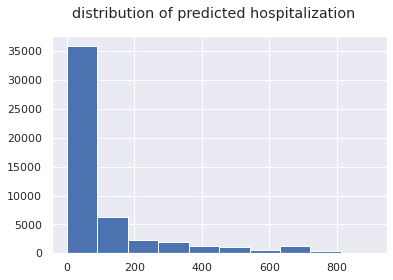

In [90]:
fig=plt.figure()
fig.suptitle('distribution of predicted hospitalization')
fig=plt.hist(y_nonhosp_rf)
plt.show()

In [91]:
non_hospital_cases.drop('hosp_patients_per_million_cal',axis=1,inplace=True)

In [92]:
non_hospital_cases.loc[:,'hosp_patients_per_million_cal']=y_nonhosp_rf
non_hospital_cases.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,total_vaccinations_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,hosp_patients_per_million_cal
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,0.026,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,11.45873
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,11.45873
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,11.45873
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,11.45873
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,11.45873


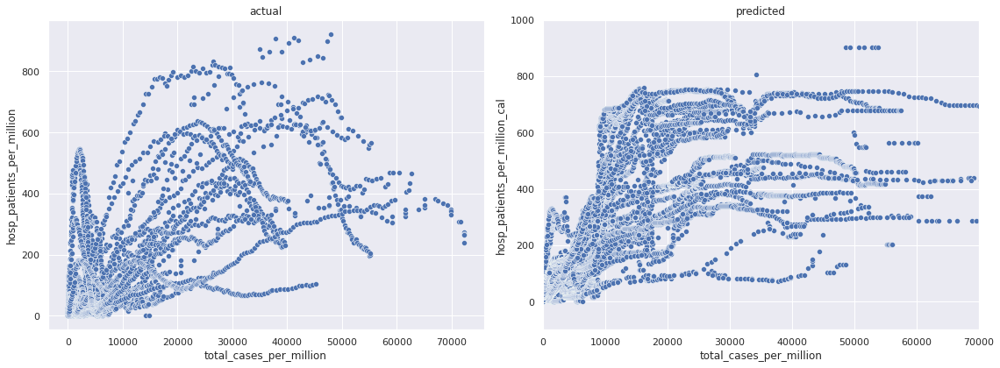

In [93]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(16,6))
axs[0]=sns.scatterplot(x='total_cases_per_million',y='hosp_patients_per_million',data=hosp_cases_fraction,ax=axs[0])
axs[0].set_title('actual')
axs[1]=sns.scatterplot(x='total_cases_per_million',y='hosp_patients_per_million_cal',data=non_hospital_cases,ax=axs[1])
axs[1].set_title('predicted')
axs[1].set_xlim(0,70000)
axs[1].set_ylim(-100,1000)
plt.tight_layout()
plt.show()

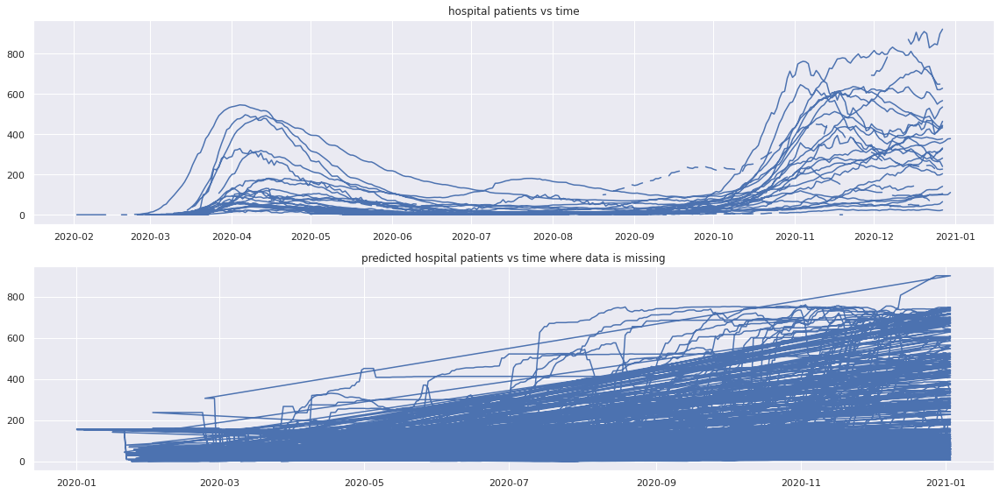

In [94]:
fig,axes=plt.subplots(figsize=(16,8),nrows=2,ncols=1)
axes[0].plot(df['date'],df['hosp_patients_per_million'])
axes[0].set_title('hospital patients vs time')
axes[1].plot(non_hospital_cases['date'],non_hospital_cases['hosp_patients_per_million_cal'])
axes[1].set_title('predicted hospital patients vs time where data is missing')
plt.tight_layout()
plt.show()

In [95]:
non_hospital_cases_loc=non_hospital_cases.groupby('location').aggregate(lambda x:x.sum()/x.count())

### <font color='blue'> Countrywise table of predicted hospitalized cases </font>

In [96]:
pd.set_option("display.max_rows",None)
non_hospital_cases_loc.sort_values('hosp_patients_per_million_cal',ascending=False)

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,total_vaccinations_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,hosp_patients_per_million_cal
location,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Hungary,2.515078e+05,1330.111111,1267.015778,7523.222222,94.111111,93.682444,26035.058667,137.687556,131.156333,778.773111,9.742222,9.697778,0.780000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8279.500000,1.519333e+06,157.275333,0.857167,9791.333333,1.013667,0.086667,42.416667,3.113500e+03,0.032500,66.670000,9.660350e+06,108.043,43.4,18.577,11.976,26777.561,0.5,278.296,7.55,26.800,34.800,NaN,7.020,76.88,0.838,524.866676
Brazil,2.920212e+06,24708.453674,24821.094172,94399.358362,669.003413,630.904003,13738.332316,116.242575,116.772487,444.108116,3.147369,2.968143,1.232368,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.181557e+06,14.967812,NaN,52873.378049,0.248756,NaN,NaN,NaN,NaN,66.807082,2.125594e+08,25.040,33.5,8.552,5.060,14103.452,3.4,177.961,8.11,10.100,17.900,NaN,2.200,75.88,0.759,440.483011
Armenia,4.864932e+04,517.886731,523.538072,905.158451,10.035211,9.265023,16417.643796,174.770773,176.677928,305.463021,3.386514,3.126658,1.130538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.963234e+06,102.931,35.7,11.232,7.571,8787.580,1.8,341.010,7.11,1.500,52.100,94.043,4.200,75.09,0.755,425.045716
Qatar,8.693265e+04,465.925806,471.570020,149.102837,0.868794,0.802905,30173.841697,161.720261,163.679348,51.752762,0.301475,0.278692,1.057239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4225.160839,5.507607e+05,191.165993,1.466531,4238.065972,1.471003,0.120385,16.789236,NaN,NaN,71.048377,2.881060e+06,227.322,31.9,1.307,0.617,116935.600,NaN,176.690,16.52,0.800,26.900,NaN,1.200,80.23,0.856,380.283592
San Marino,8.123109e+02,7.782051,7.767326,39.765472,0.192182,0.191293,23935.143429,229.301920,228.868287,1171.709397,5.662707,5.635287,0.649659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.184631,3.393800e+04,556.667,NaN,NaN,NaN,56861.470,NaN,NaN,5.64,NaN,NaN,NaN,3.800,84.97,NaN,368.652594
Bolivia,7.730501e+04,544.016722,542.590408,4493.718861,32.743772,31.155027,6622.531883,46.604575,46.482395,384.965954,2.805093,2.668963,1.075847,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1505.796226,1.817856e+05,15.573119,0.128992,1412.775439,0.121004,0.314470,4.607018,NaN,NaN,81.825548,1.167303e+07,10.202,25.4,6.704,4.393,6885.829,7.1,204.299,6.89,NaN,NaN,25.383,1.100,71.51,0.693,367.659019
Vatican,1.483553e+01,0.088816,0.087943,NaN,NaN,0.000000,18338.103954,109.784664,108.667635,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.090000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.12,NaN,362.149977
Peru,4.857868e+05,3349.009868,3387.742452,19859.482759,130.251724,125.841378,14733.382803,101.571803,102.746492,602.316407,3.950403,3.816599,1.168702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4853.666667,5.543001e+05,16.811303,0.147211,4937.219512,0.149735,NaN,NaN,NaN,NaN,82.007379,3.297185e+07,25.129,29.1,7.151,4.455,12236.706,3.5,85.755,5.95,4.800,NaN,NaN,1.600,76.74,0.750,341.979139
Moldova,4.212272e+04,483.023179,485.929808,1041.934932,10.400685,10.028394,10442.018242,119.739123,120.459657,258